<a href="https://colab.research.google.com/github/shivanandiyer/ANLP_G33/blob/main/group_code_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Install pymed and Berttopic

https://pypi.org/project/pymed/
https://maartengr.github.io/BERTopic/index.html


In [1]:
## Run code if in Google Colab
!pip install pymed

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [16]:
!pip install nltk

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
## Run code if in Google Colab
!pip install bertopic

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 120.7/120.7 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 43.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 10.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 9.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 91.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 65.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 24.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 68.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
    

# Search and retrieve Pubmed Data to a dataframe via Pymed API

In [5]:
import pandas as pd

## Run code if in Google Colab
# from google.colab import drive
# drive.mount('drive')

In [4]:
from pymed import PubMed
pubmed = PubMed(tool="PubMedSearcher", email="ivan.cheung@student.uts.edu.au")

def download_pubmed(year):
    ## create new dataframe
    df = pd.DataFrame()

    ## build search term using arg input
    search_term = '(("' + str(year) + '/01/01"[Date - Publication] : "' + str(year) + '/12/31"[Date - Publication])) AND (Cardiovascular[Title/Abstract]) AND (fha[Filter])'

    print('searching... ' + search_term)
    ## query the pubmed API
    results = pubmed.query(search_term, max_results=1000)


    ##append results into list
    for article in results:

        ## convert object to dict
        article_dict = article.toDict()
        article_dict.setdefault('journal', 'invalid')

        ## load dict to dataframe
        data = pd.DataFrame([{
            'publication_date' : article_dict['publication_date'] or str(year) + '-01-01',
            'title' : article_dict['title'],
            'abstract' : article_dict['abstract'],
            'journal' : article_dict['journal']
        }])

        ## append new data to main df
        df = pd.concat([df, data])

    return df

In [6]:
import time

## Set the initial year
year = 2023                             ## set initial search year to current year

## create new dataframe
df = pd.DataFrame()


##iterate through the last 10 years
while year > 2013:
    data = download_pubmed(year)
    df = pd.concat([df, data])

    year = year - 1
    time.sleep(5)           ## insert a sleep function to prevent PubMed from being blocked by sending too many requests in quick succession

searching... (("2023/01/01"[Date - Publication] : "2023/12/31"[Date - Publication])) AND (Cardiovascular[Title/Abstract]) AND (fha[Filter])
searching... (("2022/01/01"[Date - Publication] : "2022/12/31"[Date - Publication])) AND (Cardiovascular[Title/Abstract]) AND (fha[Filter])
searching... (("2021/01/01"[Date - Publication] : "2021/12/31"[Date - Publication])) AND (Cardiovascular[Title/Abstract]) AND (fha[Filter])
searching... (("2020/01/01"[Date - Publication] : "2020/12/31"[Date - Publication])) AND (Cardiovascular[Title/Abstract]) AND (fha[Filter])
searching... (("2019/01/01"[Date - Publication] : "2019/12/31"[Date - Publication])) AND (Cardiovascular[Title/Abstract]) AND (fha[Filter])
searching... (("2018/01/01"[Date - Publication] : "2018/12/31"[Date - Publication])) AND (Cardiovascular[Title/Abstract]) AND (fha[Filter])
searching... (("2017/01/01"[Date - Publication] : "2017/12/31"[Date - Publication])) AND (Cardiovascular[Title/Abstract]) AND (fha[Filter])
searching... (("2016

In [7]:
df.head(10000)

,publication_date,title,abstract,journal
0,2023-05-14,Pharmacotherapy of heart failure A.D. 2023. Ex...,Heart failure (HF) remains one of the most com...,Kardiologia polska
0,2023-05-14,The effect of cranial techniques on the heart ...,Heart rate variability (HRV) is a simple tool ...,Scientific reports
0,2023-05-14,Cardiovascular implications and physical activ...,The clinical manifestation of COVID-19 is asso...,Trials
0,2023-05-14,Association between the triglyceride-glucose i...,Coronary microvascular dysfunction (CMD) is a ...,Cardiovascular diabetology
0,2023-05-14,Identification of key genes and pathways in at...,Atherosclerosis (AS) is a chronic inflammatory...,BMC medical genomics
...,...,...,...,...
0,2015-01-13,Rapid identification of apolipoprotein E genot...,Apolipoprotein E (APOE) gene polymorphism can ...,Experimental and therapeutic medicine
0,2015-01-13,Rutin alleviates diabetic cardiomyopathy in a ...,"Diabetic cardiomyopathy (DCM), an independent ...",Experimental and therapeutic medicine
0,2015-01-13,Cardioprotective effect of epigallocatechin-3-...,Cardiovascular diseases are closely associated...,Experimental and therapeutic medicine
0,2015-01-13,Risk factors associated with serum levels of t...,The soluble urokinase plasminogen activator re...,Biomarker insights


## Data Description

In [8]:
df.to_csv('raw_output.csv')

In [9]:
## use to reload data
import pandas as pd

df = pd.read_csv('raw_output.csv')

In [10]:
## remove records with "invalid" journals, these are not research publications - from other sources contained within PubMed

clean_df = df[df.journal != 'invalid']

print("remove records where the journal is invalid")
print("removed records: " + str(df.size - clean_df.size))

remove records where the journal is invalid
removed records: 85


In [11]:
## remove records with null abstract
clean_df = clean_df.dropna(subset=["abstract"])

In [12]:
clean_df

,Unnamed: 0,publication_date,title,abstract,journal
0,0,2023-05-14,Pharmacotherapy of heart failure A.D. 2023. Ex...,Heart failure (HF) remains one of the most com...,Kardiologia polska
1,0,2023-05-14,The effect of cranial techniques on the heart ...,Heart rate variability (HRV) is a simple tool ...,Scientific reports
2,0,2023-05-14,Cardiovascular implications and physical activ...,The clinical manifestation of COVID-19 is asso...,Trials
3,0,2023-05-14,Association between the triglyceride-glucose i...,Coronary microvascular dysfunction (CMD) is a ...,Cardiovascular diabetology
4,0,2023-05-14,Identification of key genes and pathways in at...,Atherosclerosis (AS) is a chronic inflammatory...,BMC medical genomics
...,...,...,...,...,...
9994,0,2015-01-13,Cardiovascular imaging: a glimpse into the fut...,"In a relatively short span, technological deve...",Methodist DeBakey cardiovascular journal
9995,0,2015-01-13,Rapid identification of apolipoprotein E genot...,Apolipoprotein E (APOE) gene polymorphism can ...,Experimental and therapeutic medicine
9996,0,2015-01-13,Rutin alleviates diabetic cardiomyopathy in a ...,"Diabetic cardiomyopathy (DCM), an independent ...",Experimental and therapeutic medicine
9997,0,2015-01-13,Cardioprotective effect of epigallocatechin-3-...,Cardiovascular diseases are closely associated...,Experimental and therapeutic medicine


In [24]:
## find the number of non english words in the abstracts
clean_df['tokenised_abs'] = [tokenize(text) for text in clean_df["abstract"]]



In [25]:
i = 0
x = 0
for text in clean_df['tokenised_abs']:
    for word in text:
        if word.isascii():
            x = x + 1
        else:
            i = i + 1

print("Total English Words: " + str(x))
print("Total Non-english Words: " + str(i))
        

Total English Words: 1883700
Total Non-english Words: 15578


Word count of abstract

In [20]:
## count the number of words in each record and save to DF
df['totalwords'] = df['abstract'].str.split().str.len()

In [21]:
## Histogram/Min/Max
df['totalwords'].describe()

count    9610.000000
mean      208.418730
std        95.647207
min         1.000000
25%       151.000000
50%       209.000000
75%       253.000000
max      1366.000000
Name: totalwords, dtype: float64

Text(0.5, 1.0, 'Distribution of words per abstract')

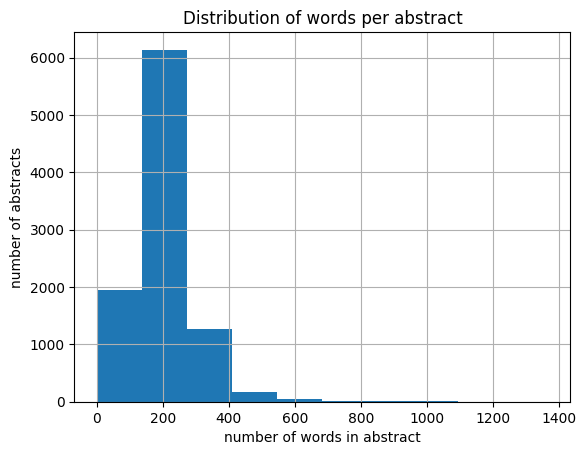

In [22]:
fig = df['totalwords'].hist()

fig.set_xlabel("number of words in abstract")
fig.set_ylabel("number of abstracts")

fig.set_title("Distribution of words per abstract")

## Data Cleaning

In [23]:
## TOKENISATION FROM GENSIMS

# Import function to convert a document into a list of tokens
# This lowercases, tokenizes, and optionally de-accents the text 
# The output are tokens (unicode strings)
from gensim.utils import simple_preprocess

# Function to tokenize the text
def tokenize(text):
    # Apply the simple_preprocess function
    text = simple_preprocess(str(text), deacc=True)
    return text

In [26]:
## STOPWORD REMOVAL

import nltk # Library with access to corpora and lexical resources
# Download the required files from nltk
nltk.download('stopwords')
# Module to access stopwords list
from nltk.corpus import stopwords
# Extract the list of english stopwords
stop_words = stopwords.words('english')

##custom stopwords
custom_stopwords = ["cardiovascular", "patient", "disease"]
stop_words.extend(custom_stopwords)

# Function to remove stopwords
def remove_stopword(text):
    tokens = []
    for token in text:
        if token not in stop_words:
            # If the token is not in the list of stopwords
            # then keep it, else discard it
            tokens.append(token)
    return tokens

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [27]:
def remove_custom_stopwords(text):
    custom_stopwords = ["cardiovascular", "patient", "disease"]
    tokens = []
    for token in text:
        if token not in custom_stopwords:
            # If the token is not in the list of stopwords
            # then keep it, else discard it
            tokens.append(token)
    return tokens

In [28]:
import spacy # Library for NLP
# Load the spacy trained pipeline to tokenize the text
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

# Function to lemmatize the tokens
def lemmatize(tokens, allowed_postags=["NOUN", "ADJ", "VERB"]):
    text = " ".join(tokens)
    text = nlp(text)
    lemmatized_tokens = []
    
    for token in text:
        if token.pos_ in allowed_postags:
            lemmatized_tokens.append(token.lemma_)
    
    return lemmatized_tokens

In [29]:
def remove_nonenglish(text):
    english_text = []

    for word in text:
        if word.isascii():
            english_text.append(word)
        
    return english_text

In [30]:
## removes warning messages in print
pd.options.mode.chained_assignment = None

# Tokenize the texts
clean_df['tokenised_abs'] = [tokenize(text) for text in clean_df["abstract"]]

# Remove stopwords
#clean_df['removed_stopwords'] = [remove_stopword(text) for text in clean_df['tokenised_abs']]

# Lemmatize the text
clean_df['lemmatise'] = [lemmatize(text) for text in clean_df['tokenised_abs']]

## second pass of custom stopwords after lemmatization (this is due to the word "patient" reappearing after lemmatisation)
#clean_df['lemmatise'] = [remove_custom_stopwords(text) for text in clean_df['lemmatise']]

# Remove non-english words
clean_df['clean_abstract'] = [remove_nonenglish(text) for text in clean_df['lemmatise']]

# Combine the tokens to form a single string
clean_df['clean_abstract'] = [" ".join(tokens) for tokens in clean_df['clean_abstract'] ]

## restores warning messages
pd.options.mode.chained_assignment = 'warn'

In [31]:
clean_df

,Unnamed: 0,publication_date,title,abstract,journal,tokenised_abs,lemmatise,clean_abstract
0,0,2023-05-14,Pharmacotherapy of heart failure A.D. 2023. Ex...,Heart failure (HF) remains one of the most com...,Kardiologia polska,"[heart, failure, hf, remains, one, of, the, mo...","[heart, failure, remain, common, cause, hospit...",heart failure remain common cause hospitalizat...
1,0,2023-05-14,The effect of cranial techniques on the heart ...,Heart rate variability (HRV) is a simple tool ...,Scientific reports,"[heart, rate, variability, hrv, is, simple, to...","[heart, rate, variability, hrv, simple, tool, ...",heart rate variability hrv simple tool monitor...
2,0,2023-05-14,Cardiovascular implications and physical activ...,The clinical manifestation of COVID-19 is asso...,Trials,"[the, clinical, manifestation, of, covid, is, ...","[clinical, manifestation, covid, associate, in...",clinical manifestation covid associate infecti...
3,0,2023-05-14,Association between the triglyceride-glucose i...,Coronary microvascular dysfunction (CMD) is a ...,Cardiovascular diabetology,"[coronary, microvascular, dysfunction, cmd, is...","[strong, determinant, prognosis, patient, chro...",strong determinant prognosis patient chronic t...
4,0,2023-05-14,Identification of key genes and pathways in at...,Atherosclerosis (AS) is a chronic inflammatory...,BMC medical genomics,"[atherosclerosis, as, is, chronic, inflammator...","[atherosclerosis, chronic, inflammatory, disea...",atherosclerosis chronic inflammatory disease i...
...,...,...,...,...,...,...,...,...
9994,0,2015-01-13,Cardiovascular imaging: a glimpse into the fut...,"In a relatively short span, technological deve...",Methodist DeBakey cardiovascular journal,"[in, relatively, short, span, technological, d...","[short, span, technological, development, card...",short span technological development cardiovas...
9995,0,2015-01-13,Rapid identification of apolipoprotein E genot...,Apolipoprotein E (APOE) gene polymorphism can ...,Experimental and therapeutic medicine,"[apolipoprotein, apoe, gene, polymorphism, can...","[apolipoprotein, gene, polymorphism, affect, a...",apolipoprotein gene polymorphism affect apoe g...
9996,0,2015-01-13,Rutin alleviates diabetic cardiomyopathy in a ...,"Diabetic cardiomyopathy (DCM), an independent ...",Experimental and therapeutic medicine,"[diabetic, cardiomyopathy, dcm, an, independen...","[dcm, independent, coronary, heart, disease, d...",dcm independent coronary heart disease develop...
9997,0,2015-01-13,Cardioprotective effect of epigallocatechin-3-...,Cardiovascular diseases are closely associated...,Experimental and therapeutic medicine,"[cardiovascular, diseases, are, closely, assoc...","[cardiovascular, disease, associate, high, cho...",cardiovascular disease associate high choleste...


In [32]:
## Save clean df to csv for future load
clean_df.to_csv('clean_output.csv')

## Running Model without pre-processing steps

In [33]:
docs = clean_df['abstract'].astype('str').tolist()

In [34]:
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
vectorizer_model = CountVectorizer()

topic_model = BERTopic(language="english", verbose=True, calculate_probabilities=False, nr_topics=20)

topics, probs = topic_model.fit_transform(docs)

Batches:   0%|          | 0/300 [00:00<?, ?it/s]

2023-05-14 11:26:18,549 - BERTopic - Transformed documents to Embeddings
2023-05-14 11:27:06,039 - BERTopic - Reduced dimensionality
2023-05-14 11:27:06,531 - BERTopic - Clustered reduced embeddings
2023-05-14 11:27:21,686 - BERTopic - Reduced number of topics from 163 to 20


In [35]:
freq = topic_model.get_topic_info() 
freq.head(11)

,Topic,Count,Name
0,-1,2954,-1_the_and_of_in
1,0,2887,0_the_of_and_in
2,1,529,1_the_of_and_in
3,2,502,2_and_of_the_in
4,3,448,3_the_of_and_in
5,4,434,4_covid19_of_the_and
6,5,367,5_the_of_in_and
7,6,329,6_the_statin_of_and
8,7,238,7_the_and_of_to
9,8,156,8_women_pcos_and_the


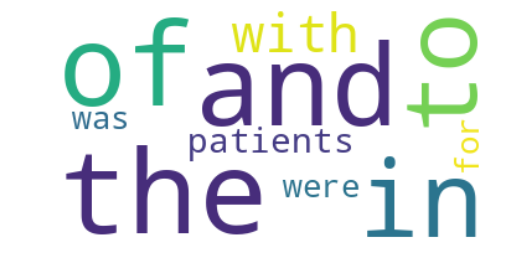

In [36]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(model, topic):
    text = {word: value for word, value in model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Show wordcloud
create_wordcloud(topic_model, topic=0)

## Convert Article Abstracts to a list for Topic Modelling

In [37]:
docs = clean_df['clean_abstract'].tolist()

In [38]:
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.vectorizers import ClassTfidfTransformer

# We can also use the ClassTfidfTransformer to reduce the impact of frequent words. 
# The end result is very similar to explictly removing stopwords but this process does this automatically.
# This distinction is important because it will capture words that I would have built using custom stopwords.
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

# At times, stop words might end up in our topic representations. 
# This is something we typically want to avoid as they contribute little to the interpretation of the topics. 
# However, removing stop words as a preprocessing step is not advised as the transformer-based embedding models that 
# we use need the full context in order to create accurate embeddings.
# we can use the CountVectorizer to preprocess our documents after having generated embeddings and 
# clustered our documents. 
vectorizer_model = CountVectorizer(stop_words="english")

topic_model = BERTopic(language="english", 
                       calculate_probabilities=False, 
                       verbose=True,
                       ctfidf_model=ctfidf_model,
                       vectorizer_model=vectorizer_model, 
                       nr_topics=20)
topics, probs = topic_model.fit_transform(docs)

Batches:   0%|          | 0/300 [00:00<?, ?it/s]

2023-05-14 11:47:19,612 - BERTopic - Transformed documents to Embeddings
2023-05-14 11:47:43,072 - BERTopic - Reduced dimensionality
2023-05-14 11:47:43,563 - BERTopic - Clustered reduced embeddings
2023-05-14 11:47:54,882 - BERTopic - Reduced number of topics from 121 to 20


In [39]:
## Save model for reloading later on
topic_model.save("topic_model")

In [ ]:
## Reload model from save file
from bertopic import BERTopic
topic_model = BERTopic.load("topic_model")

# Extracting Topics
After fitting the model, we look at the results- the most frequent topics first as they best represent the collection of documents

In [40]:
freq = topic_model.get_topic_info(); freq.head(21)

,Topic,Count,Name
0,-1,3228,-1_risk_study_disease_high
1,0,2917,0_patient_sleep_use_coronary
2,1,548,1_child_obesity_exercise_obese
3,2,545,2_ckd_kidney_dialysis_renal
4,3,494,3_vitamin_food_intake_dietary
5,4,267,4_air_stem_pollution_cell
6,5,239,5_pregnancy_maternal_testosterone_woman
7,6,207,6_cognitive_depression_anxiety_dementia
8,7,206,7_covid_cov_infection_sar
9,8,182,8_cancer_breast_chemotherapy_survivor


## Select the most frequent topic

In [41]:
topic_model.get_topic(18)  

[('thank', 3.928798945250662),
 ('comment', 3.566225449930759),
 ('root', 2.8045310553114984),
 ('issue', 2.2789731419996606),
 ('leave', 1.91699198578207),
 ('', 1e-05),
 ('', 1e-05),
 ('', 1e-05),
 ('', 1e-05),
 ('', 1e-05)]

In [42]:
topic_df = topic_model.get_document_info(docs)

In [43]:
topic_df

,Document,Topic,Name,Top_n_words,Probability,Representative_document
0,heart failure remain common cause hospitalizat...,-1,-1_risk_study_disease_high,risk - study - disease - high - factor - cardi...,0.000000,False
1,heart rate variability hrv simple tool monitor...,-1,-1_risk_study_disease_high,risk - study - disease - high - factor - cardi...,0.000000,False
2,clinical manifestation covid associate infecti...,-1,-1_risk_study_disease_high,risk - study - disease - high - factor - cardi...,0.000000,False
3,strong determinant prognosis patient chronic t...,0,0_patient_sleep_use_coronary,patient - sleep - use - coronary - cardiovascu...,0.919974,False
4,atherosclerosis chronic inflammatory disease i...,0,0_patient_sleep_use_coronary,patient - sleep - use - coronary - cardiovascu...,0.603521,False
...,...,...,...,...,...,...
9588,short span technological development cardiovas...,0,0_patient_sleep_use_coronary,patient - sleep - use - coronary - cardiovascu...,1.000000,False
9589,apolipoprotein gene polymorphism affect apoe g...,9,9_mutation_genotype_genetic_polymorphism,mutation - genotype - genetic - polymorphism -...,0.265592,False
9590,dcm independent coronary heart disease develop...,0,0_patient_sleep_use_coronary,patient - sleep - use - coronary - cardiovascu...,0.779327,False
9591,cardiovascular disease associate high choleste...,-1,-1_risk_study_disease_high,risk - study - disease - high - factor - cardi...,0.000000,False


## Visualise Topics

### The Intertopic Distance Map represents the prevalance of the topics and how closely they are related to one another

In [44]:
import plotly.express as px

fig = topic_model.visualize_topics()

fig.show()


In [45]:
import json

rep_docs = topic_model.get_representative_docs()

with open("rep_docs.txt", "w") as fp:
    json.dump(rep_docs, fp)


In [46]:
list = rep_docs[11]

In [47]:
## Build a wordcloud from the list of words
words = (" ").join(list)
wc = WordCloud(background_color="white", max_words=1000)
wc.generate(words)

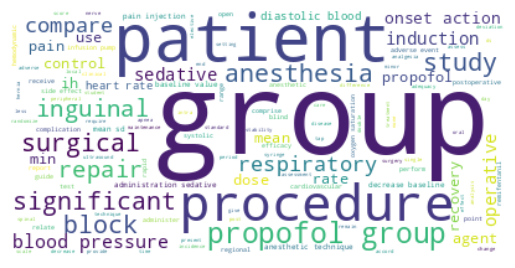

In [48]:
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

### Topic Hierarchy

We can see that topics with the same colors have been grouped together. For instance:

Topic 29 (cardiotoxicity, cardiac, myocardial) & 40 (diabetic, cardiac) have been grouped together because of their closeness.

This info is helpful to better understand the reason why the topics have been considered to be similar to one another.

In [49]:
topic_model.visualize_hierarchy(top_n_topics=20)

## Topic Word Scores

Visualize the selected terms for a few topics  and their c-TF-IDF scores for each topic representation. Also comparing the topic representation to each other 

In [50]:
topic_model.visualize_barchart(top_n_topics=21)

## Topic Similarity

Similarity matrix generated by applying cosine similarities through those topic embeddings indicates how similar certain topics are to each other.

In [52]:
topic_model.visualize_heatmap(n_clusters=10, width=1000, height=1000)

In [53]:
# Calculate the topic distributions on a token-level
topic_distr, topic_token_distr = topic_model.approximate_distribution(docs, calculate_tokens=True)


100%|██████████| 10/10 [00:23<00:00,  2.31s/it]


In [65]:

# Visualize the token-level distributions
df = topic_model.visualize_approximate_distribution(docs[2], topic_token_distr[2])
df


,clinical,manifestation,covid,associate,infection,inflammation,lung,evidence,suggest,covid,affect,structure,function,cardiovascular,system,present,understand,extent,covid,impact,cardiovascular,function,short,long,term,follow,infection,aim,present,study,twofold,define,effect,covid,cardiovascular,function,arterial,stiffness,cardiac,systolic,diastolic,function,healthy,individual,evaluate,effect,home,base,physical,activity,intervention,cardiovascular,function,people,history,covid,prospective,single,centre,observational,study,recruit,covid,vaccinated,adult,participant,age,year,history,covid,healthy,control,history,covid,participant,undergo,baseline,assessment,include,lead,heart,rate,variability,arterial,stiffness,rest,stress,speckle,track,image,spirometry,maximal,cardiopulmonary,exercise,testing,day,physical,activity,sleep,measure,quality,life,questionnaire,blood,sample,collect,assess,expression,profile,cardiac,inflammatory,biomarker,type,natriuretic,peptide,tumour,necrosis,factor,alpha,interleukin,reactive,protein,dimer,vascular,endothelial,growth,factor,follow,baseline,assessment,covid,participant,randomise,week,home,base,physical,activity,intervention,aim,increase,daily,number,step,baseline,primary,outcome,change,left,ventricular,global,longitudinal,secondary,outcome,arterial,stiffness,systolic,diastolic,function,heart,functional,capacity,lung,function,sleep,measure,quality,life,depression,anxiety,stress,sleep,efficiency,study,provide,insight,cardiovascular,implication,covid,malleability,home,base,physical,activity,intervention,clinicaltrial,register
6_cognitive_depression_anxiety_dementia,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.103,0.227,0.364,0.490,0.387,0.263,0.125,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
7_covid_cov_infection_sar,0.134,0.291,0.450,0.551,0.417,0.260,0.219,0.238,0.341,0.341,0.223,0.103,0.000,0.000,0.000,0.000,0.000,0.000,0.120,0.120,0.120,0.120,0.000,0.101,0.101,0.201,0.303,0.202,0.202,0.102,0.000,0.122,0.248,0.364,0.364,0.242,0.116,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.108,0.212,0.212,0.212,0.104,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.122,0.231,0.337,0.443,0.428,0.427,0.421,0.315,0.209,0.100,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.107,0.107,0.107,0.107,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
12_mirna_mir_microrna_mirnas,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.

# **Search Topics**

`find_topics` to search for topics that are similar 
to an input search_term. Searching for topics that closely relate the search term. Then, we extract the most similar topic and check the results: 

In [ ]:
similar_topics, similarity = topic_model.find_topics("covid", top_n=5); similar_topics

[-1, 0, 11, 3, 9]

In [ ]:
topic_model.get_topic(50)

False

## Merging Topics back into Clean Dataframe

In [ ]:
clean_df["topic"] = topic_df["Topic"]

C:\Users\Ivan\AppData\Local\Temp\ipykernel_40340\3979107983.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
clean_df.head()

,Unnamed: 0,publication_date,title,abstract,journal,tokenised_abs,lemmatise,clean_abstract,topic
0,0,2023-05-09,Weight gain prevention interventions in the St...,Cardiovascular health (CVH) declines in young ...,"Obesity (Silver Spring, Md.)","[cardiovascular, health, cvh, declines, in, yo...","[cardiovascular, health, cvh, decline, young, ...",cardiovascular health cvh decline young adulth...,-1.0
1,0,2023-05-09,Dosage Optimization of Digoxin in Older Patien...,Renal function is an important index for digox...,Drugs & aging,"[renal, function, is, an, important, index, fo...","[renal, function, important, index, adjustment...",renal function important index adjustment pati...,1.0
2,0,2023-05-09,Age-dependent differences and similarities in ...,Delirium is an acute confusional state and a c...,Scientific reports,"[delirium, is, an, acute, confusional, state, ...","[delirium, acute, confusional, state, common, ...",delirium acute confusional state common postop...,-1.0
3,0,2023-05-09,Characterizing non-communicable disease trends...,Undocumented migrants represent a large part o...,Scientific reports,"[undocumented, migrants, represent, large, par...","[undocumented, migrant, represent, large, part...",undocumented migrant represent large part popu...,0.0
4,0,2023-05-09,Structural mechanisms of TRPM7 activation and ...,The transient receptor potential channel TRPM7...,Nature communications,"[the, transient, receptor, potential, channel,...","[transient, receptor, potential, channel, mast...",transient receptor potential channel master re...,0.0


In [ ]:
clean_df.loc[clean_df['topic'] == 18].head()

,Unnamed: 0,publication_date,title,abstract,journal,tokenised_abs,lemmatise,clean_abstract,topic
284,0,2023-05-05,"Associations of emotional social support, depr...",Cardiovascular diseases (CVDs) are a major cau...,BMC cardiovascular disorders,"[cardiovascular, diseases, cvds, are, major, c...","[cardiovascular, disease, cvds, major, cause, ...",cardiovascular disease cvds major cause morbid...,18.0
620,0,2023-05-01,Lactate dehydrogenase and aspartate aminotrans...,Lactate dehydrogenase (LDH) and aspartate amin...,Experimental and therapeutic medicine,"[lactate, dehydrogenase, ldh, and, aspartate, ...","[dehydrogenase, ldh, aspartate, important, ind...",dehydrogenase ldh aspartate important indicato...,18.0
1129,0,2023-03-23,Effect of vitamin D on myocardial remodeling a...,Vitamin D insufficiency is a common public hea...,Turkish journal of medical sciences,"[vitamin, insufficiency, is, common, public, h...","[vitamin, insufficiency, common, public, healt...",vitamin insufficiency common public health pro...,18.0
1337,0,2023-02-18,Predictors of Mortality for Patients with ST-E...,Mortality of ST-elevation myocardial infarctio...,Advanced biomedical research,"[mortality, of, st, elevation, myocardial, inf...","[mortality, elevation, myocardial, infarction,...",mortality elevation myocardial infarction stem...,18.0
1775,0,2023-01-24,Clinical effect and biological mechanism of ex...,Rheumatoid arthritis (RA) is a common systemat...,Frontiers in immunology,"[rheumatoid, arthritis, ra, is, common, system...","[common, systematic, chronic, inflammatory, po...",common systematic chronic inflammatory polyart...,18.0


In [ ]:
topic_model.visualize_documents(docs)

c:\Users\Ivan\AppData\Local\Programs\Python\Python310\lib\site-packages\bertopic\plotting\_documents.py:151: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Ivan\AppData\Local\Programs\Python\Python310\lib\site-packages\bertopic\plotting\_documents.py:152: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Ivan\AppData\Local\Programs\Python\Python310\lib\site-packages\bertopic\plotting\_documents.py:171: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



In [ ]:
topics_df = clean_df[['topic', 'publication_date', 'journal']]

In [ ]:
topics_df.to_csv('topics_output.csv')